<a href="https://colab.research.google.com/github/gitvanya34/SortifyScan/blob/main/demosortifyscan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Подготовка

* Импорт библиотек
* Импорт модуля SortifyScan




In [ ]:
FLAG_COLAB = True

In [ ]:
if FLAG_COLAB:
  from google.colab import drive
  drive.mount('/content/drive')
  !pip install ultralytics
  !pip install shapely
  !pip install pillow
  FLAG_COLAB = False


Mounted at /content/drive
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.6/780.6 kB 11.4 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nv

In [ ]:
!git clone -b colab https://github.com/gitvanya34/SortifyScan.git

fatal: not a git repository (or any of the parent directories): .git


In [ ]:
%cd /content/SortifyScan
!git pull origin colab
%cd /content


/content/SortifyScan
From https://github.com/gitvanya34/SortifyScan
 * branch            colab      -> FETCH_HEAD
Already up to date.
/content


In [ ]:
import sys
sys.path.append("/content/SortifyScan")
sys.path.append("/content/SortifyScan/SortifyScanAPI")
sys.path.append("/content/SortifyScan/SortifyScanAPI/cargo")
sys.path.append("/content/SortifyScan/SortifyScanAPI/useCaseCargo")
# import SortifyScan
import gc
import json
import torch


In [ ]:
from sortifyscan.cargo import *
from sortifyscan.export import ExportMedia
from sortifyscan.Isortifyscan import ISortifyScan
from sortifyscan.cargo import constants


In [ ]:
%run /content/SortifyScan/SortifyScanAPI/sortifyscan/__init__.py

# Запуск модуля SorifyScan

In [ ]:
if __name__ == '__main__':
    constants.DEBUG = False
    ISortifyScan.sortify_scan("/content/drive/MyDrive/images/render1.png")


image 1/1 /content/drive/MyDrive/images/render1.png: 640x640 1 package, 3878.7ms

Обработка кадра 0

Ultralytics YOLOv8.2.31 🚀 Python-3.10.12 torch-2.3.0+cu121 CPU (Intel Xeon 2.20GHz)

0: 1024x1024 232.0ms
Speed: 0.0ms preprocess, 232.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to runs/segment/predict8

 подготовка к детальной сегментации заняла 0.0066089630126953125  секунд


 Поиск контуров занял  1.3242864608764648  секунд


 Апроксимация заняла 0.016550779342651367  секунд

Длина (0.569м): 0.5501072868334309м; delta 1.8892713166569042см, %3.4343688256377596
Ширина (0.516м): 0.49839987182617185м; delta 1.7600128173828167см, %3.531326785727306
Высота (0.381м): 0.4318265603771066м; delta -5.082656037710659см, %-11.77013297485005
None

Итерация 0 заняла 12.955161809921265 секунд

Speed: 2.9ms preprocess, 3878.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict8


Результаты работы модуля сохраняются в папку Output

## Результат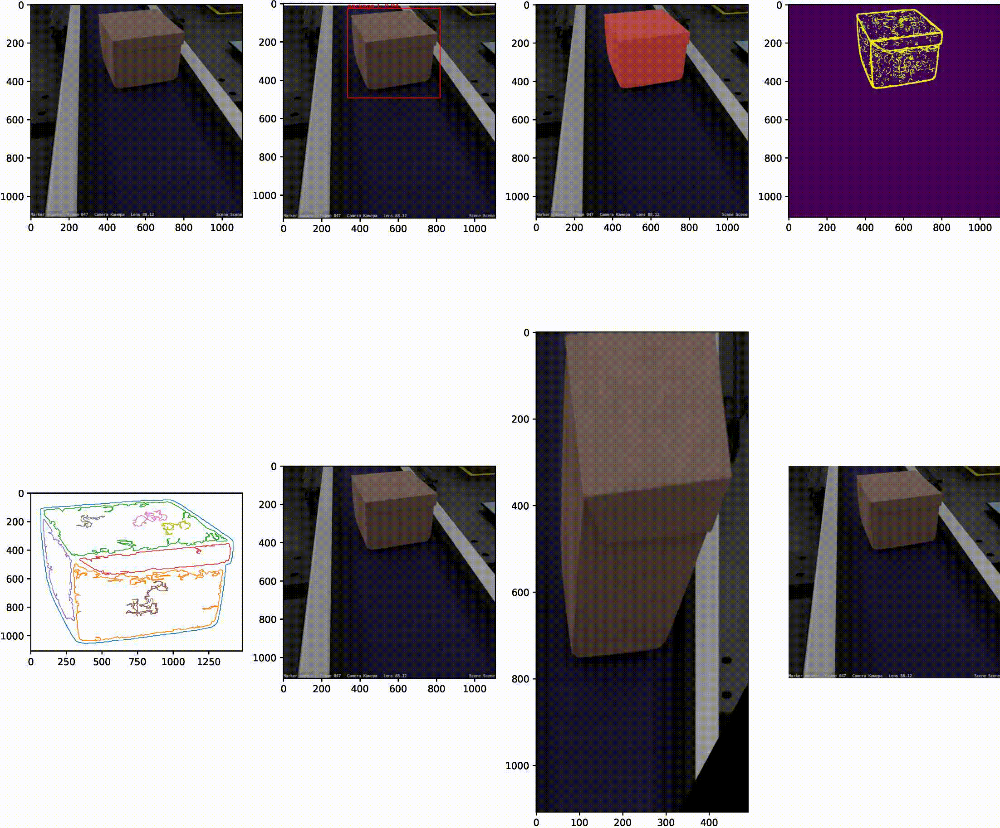

# Подробнее в режиме дебага

## Калибровка рабочей области

In [ ]:

LENT_REAL_LEFT = 2.71
LENT_REAL_RIGHT = 2.71
LENT_REAL_UP = 0.8
LENT_REAL_DOWN = 0.8
LENT_REAL_WIGHT = 0.8
LENT_REAL_CAMERA_LEN = 1.10854

ARR_LENT_LEFT = np.array([[166, 30], [187, 557]])
ARR_LENT_RIGHT = np.array([[343, 21], [638, 491]])
ARR_LENT_UP = np.array([[166, 30], [343, 21]])
ARR_LENT_DOWN = np.array([[187, 557], [638, 491]])

JSON_BORDERS = {'left': {'line': {'xy': ARR_LENT_LEFT, 'length': LENT_REAL_LEFT}},
                 'right': {'line': {'xy': ARR_LENT_RIGHT, 'length': LENT_REAL_RIGHT}},
                 'up': {'line': {'xy': ARR_LENT_UP, 'length': LENT_REAL_UP}},
                 'down': {'line': {'xy': ARR_LENT_DOWN, 'length': LENT_REAL_DOWN}},
                 }

Требуется заполнить границы рабочей области, а так же размеры рабочей области

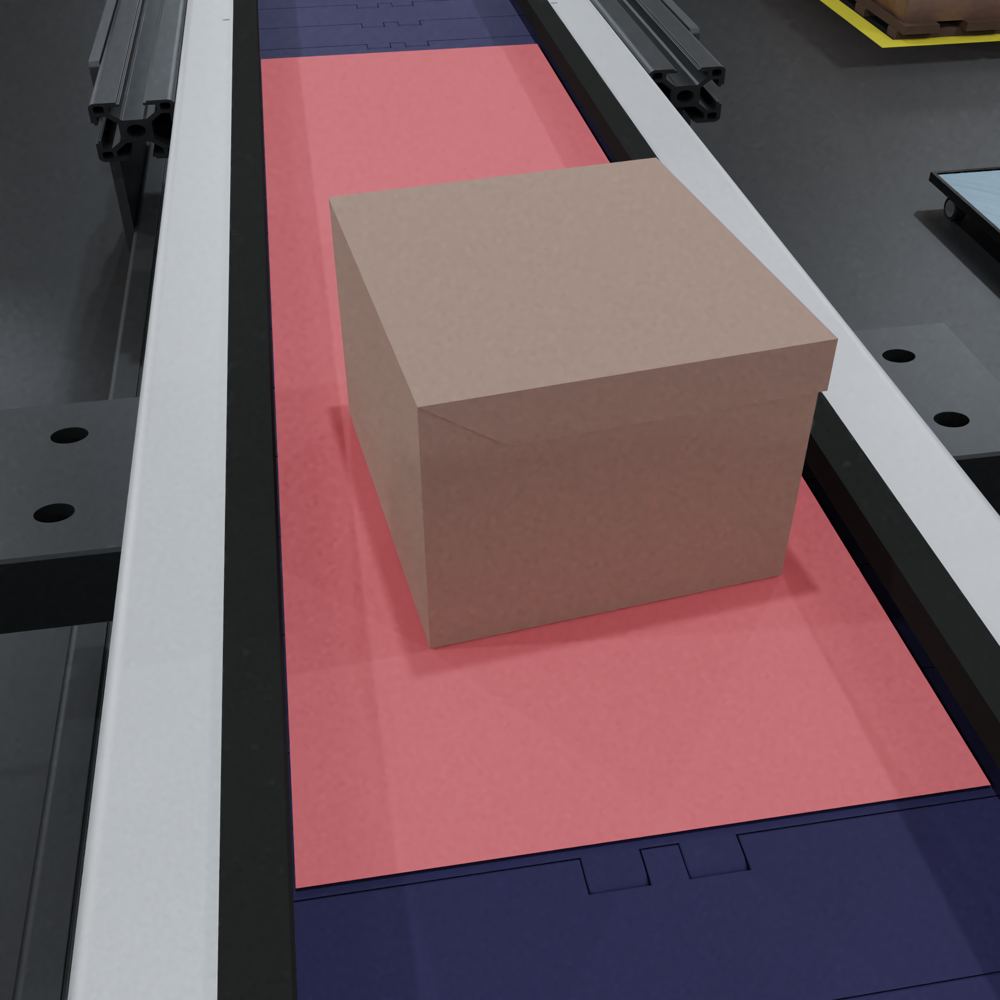

## Импорты

In [ ]:
import gc
import time
import traceback

import cv2
import torch
from matplotlib import pyplot as plt

from sortifyscan import ExportMedia, JSON_BORDERS, CargoProcessing, CargoAnalysis, CargoDetection, PATH_WEIGHTS_YOLO, \
    PATH_WEIGHTS_SAM, PATH_WEIGHTS_SEGYOLO9
from sortifyscan.cargo import boxwgh
constants.DEBUG = True

## Создание списка генераторов для обработки видеорядов

In [ ]:
path_images = "/content/drive/MyDrive/images/render1.png"
detection = CargoDetection(PATH_WEIGHTS_YOLO, PATH_WEIGHTS_SAM, PATH_WEIGHTS_SEGYOLO9, path_images)

results_det = detection.detect_cargo()
for _ in results_det:
  result_det = _
  print(result_det)
n_shot = 0
export = ExportMedia()


image 1/1 /content/drive/MyDrive/images/render1.png: 640x640 1 package, 5138.9ms
ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'label', 1: 'package'}
obb: None
orig_img: array([[[48, 47, 46],
        [48, 47, 46],
        [49, 48, 47],
        ...,
        [53, 62, 79],
        [52, 62, 79],
        [52, 62, 79]],

       [[49, 47, 46],
        [49, 47, 46],
        [49, 48, 47],
        ...,
        [52, 61, 77],
        [51, 60, 77],
        [51, 61, 78]],

       [[50, 48, 47],
        [50, 48, 47],
        [50, 48, 47],
        ...,
        [51, 60, 77],
        [51, 60, 76],
        [50, 59, 76]],

       ...,

       [[51, 48, 46],
        [51, 49, 46],
        [50, 48, 45],
        ...,
        [77, 44, 43],
        [74, 42, 41],
        [73, 41, 40]],

       [[52, 50, 47],
        [51, 48, 46],
        [51, 49, 46],
        ...,
        [78, 45, 44],
        [76, 43, 42],
     

## Перевод системы координат в "ортогональную", на основании данных калибровки


Обработка кадра 0



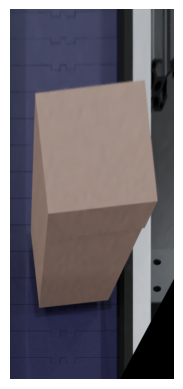

In [ ]:
print(f"\nОбработка кадра {n_shot}\n")
borders = boxwgh.Borders(JSON_BORDERS)
borders.draw_image_orto(image=cv2.cvtColor(result_det.orig_img, cv2.COLOR_BGR2RGB),
                        save_dir_path=export.folder_name_orto,
                        name_img=n_shot)

## Детекция

In [ ]:
json_result_detection = CargoProcessing.result_to_json(result_det)
print(json_result_detection)

[
  {
    "name": "package",
    "class": 1,
    "confidence": 0.9396,
    "box": {
      "x1": 205.09143,
      "y1": 52.09015,
      "x2": 523.11316,
      "y2": 352.80157
    }
  }
]


In [ ]:
bbox = CargoProcessing.get_bbox_from_result(json_result_detection)
bbox

[205.09143, 52.09015, 523.11316, 352.80157]

In [ ]:
CargoProcessing.show_image_detection(result_det, n_shot, export.folder_name_detection_bbox)

## Сегментация

### Сегментация целого объекта

In [ ]:

result_seg = detection.segment_cargo_bboxes_SAM(result_det.orig_img, bbox)[0]
result_seg

Ultralytics YOLOv8.2.31 🚀 Python-3.10.12 torch-2.3.0+cu121 CPU (Intel Xeon 2.20GHz)

0: 1024x1024 417.9ms
Speed: 0.0ms preprocess, 417.9ms inference, 6.3ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to runs/segment/predict9


ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: '0'}
obb: None
orig_img: array([[[48, 47, 46],
        [48, 47, 46],
        [49, 48, 47],
        ...,
        [53, 62, 79],
        [52, 62, 79],
        [52, 62, 79]],

       [[49, 47, 46],
        [49, 47, 46],
        [49, 48, 47],
        ...,
        [52, 61, 77],
        [51, 60, 77],
        [51, 61, 78]],

       [[50, 48, 47],
        [50, 48, 47],
        [50, 48, 47],
        ...,
        [51, 60, 77],
        [51, 60, 76],
        [50, 59, 76]],

       ...,

       [[51, 48, 46],
        [51, 49, 46],
        [50, 48, 45],
        ...,
        [77, 44, 43],
        [74, 42, 41],
        [73, 41, 40]],

       [[52, 50, 47],
        [51, 48, 46],
        [51, 49, 46],
        ...,
        [78, 45, 44],
        [76, 43, 42],
        [73, 41, 40]],

       [[51, 49, 47],
        [51, 49, 47],
        [51, 49, 47],
        ...,
  

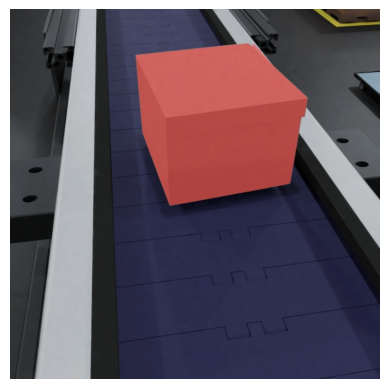

In [ ]:
CargoProcessing.show_image_after_ultralytics(result_seg,
                                              n_shot=n_shot,
                                              save_dir_path=export.folder_name_sam)

### Сегментация каждой грани на основании данных облака точек


 подготовка к детальной сегментации заняла 0.005570173263549805  секунд



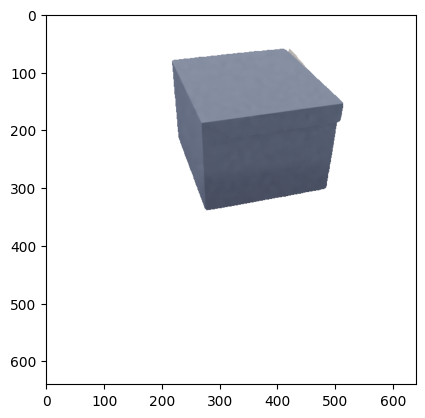


 Поиск контуров занял  1.272822618484497  секунд



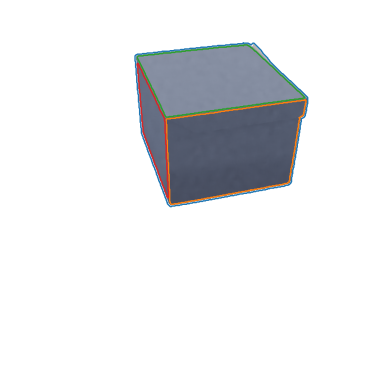

[array([[[509, 157]],
 
        [[510, 156]],
 
        [[511, 156]],
 
        ...,
 
        [[506, 157]],
 
        [[507, 157]],
 
        [[508, 157]]], dtype=int32),
 array([[[404,  62]],
 
        [[405,  61]],
 
        [[406,  61]],
 
        ...,
 
        [[401,  62]],
 
        [[402,  62]],
 
        [[403,  62]]], dtype=int32),
 array([[[220,  94]],
 
        [[221,  93]],
 
        [[222,  94]],
 
        [[222,  95]],
 
        [[223,  96]],
 
        [[223,  97]],
 
        [[224,  98]],
 
        [[224,  99]],
 
        [[224, 100]],
 
        [[225, 101]],
 
        [[225, 102]],
 
        [[226, 103]],
 
        [[227, 104]],
 
        [[227, 105]],
 
        [[228, 106]],
 
        [[228, 107]],
 
        [[228, 108]],
 
        [[229, 109]],
 
        [[229, 110]],
 
        [[230, 111]],
 
        [[230, 112]],
 
        [[230, 113]],
 
        [[231, 114]],
 
        [[231, 115]],
 
        [[232, 116]],
 
        [[232, 117]],
 
        [[233, 118]],
 
        

In [ ]:
result_side = detection.segmentation_of_the_side(result_seg,
                                                  result_det,
                                                  False,
                                                  "white",
                                                  n_shot=n_shot,
                                                  path_dir_segment=export.folder_name_segmentation,
                                                  path_dir_points=export.folder_name_points,
                                                  )
result_side

In [ ]:
point_cloud = CargoAnalysis.get_xy_edges_OpenCV(result_side)
point_cloud

[[array([509, 510, 511, 512, 512, 512, 512, 512, 511, 511, 511, 511, 511, 510, 510, 510, 510, 510, 509, 509, 509, 509, 509, 509, 508, 508, 508, 508, 507, 507, 506, 505, 504, 503, 502, 501, 500, 501, 501, 501, 501, 500, 500, 500, 500, 500, 499, 499, 499, 499, 499, 499, 499, 499, 498, 498, 498, 498, 498, 498, 497, 497,
         497, 497, 497, 497, 496, 496, 496, 496, 496, 496, 496, 495, 495, 495, 495, 495, 494, 494, 494, 494, 494, 494, 494, 494, 493, 493, 493, 493, 493, 493, 492, 492, 492, 492, 492, 491, 491, 491, 491, 491, 491, 491, 490, 490, 490, 490, 489, 489, 489, 489, 489, 489, 489, 489, 488, 488, 488, 488, 487, 487, 487, 487,
         486, 486, 486, 486, 486, 486, 486, 486, 485, 485, 485, 485, 485, 484, 484, 484, 484, 484, 484, 484, 484, 483, 483, 483, 482, 481, 480, 479, 478, 477, 476, 475, 474, 473, 472, 471, 470, 469, 468, 467, 466, 465, 464, 463, 462, 461, 460, 459, 458, 457, 456, 455, 454, 453, 452, 451, 450, 449, 448, 447, 446, 445,
         444, 443, 442, 441, 440, 439, 438,

In [ ]:
len(point_cloud)

9

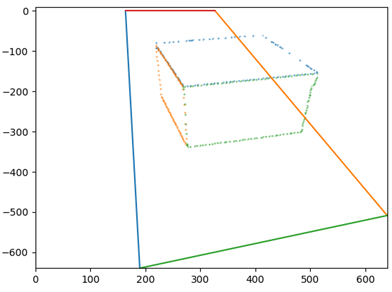

In [ ]:
line_strings_all = CargoAnalysis.approximate_point_cloud(point_cloud)


 Апроксимация заняла 0.015073537826538086  секунд



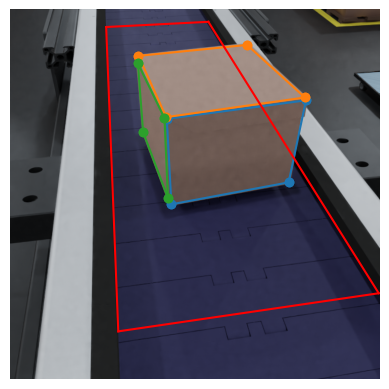

In [ ]:
CargoAnalysis.draw_edges(line_strings_all,
                          cv2.cvtColor(result_det.orig_img, cv2.COLOR_BGR2RGB),
                          n_shot,
                          path=export.folder_name_skeleton)

In [ ]:
# Формируем словарь граней c координатами
sides_dict = {"sides": []}
for i, side in enumerate(line_strings_all):
    edge_dict = {"edges": []}
    for j, edge in enumerate(side):
        edge_dict[f"edges"].append(
            {f"line": {"xy": [[edge.xy[0][0], -edge.xy[1][0]], [edge.xy[0][1], -edge.xy[1][1]]],
                        "centoroid": {"xy": [edge.centroid.xy[0][0], -edge.centroid.xy[1][0]]}}})
    sides_dict[f"sides"].append(edge_dict)

In [ ]:
sides_dict

{'sides': [{'edges': [{'line': {'xy': [[279.0, 337.0], [271.0, 189.0]],
      'centoroid': {'xy': [275.0, 263.0]}}},
    {'line': {'xy': [[271.0, 189.0], [512.0, 157.0]],
      'centoroid': {'xy': [391.5, 173.0]}}},
    {'line': {'xy': [[512.0, 157.0], [482.0, 299.0]],
      'centoroid': {'xy': [497.00000000000006, 228.0]}}},
    {'line': {'xy': [[482.0, 299.0], [279.0, 337.0]],
      'centoroid': {'xy': [380.5, 318.0]}}}]},
  {'edges': [{'line': {'xy': [[270.0, 186.0], [222.0, 80.0]],
      'centoroid': {'xy': [246.0, 133.0]}}},
    {'line': {'xy': [[222.0, 80.0], [410.0, 61.0]],
      'centoroid': {'xy': [316.0, 70.5]}}},
    {'line': {'xy': [[410.0, 61.0], [510.0, 152.0]],
      'centoroid': {'xy': [460.0, 106.5]}}},
    {'line': {'xy': [[510.0, 152.0], [270.0, 186.0]],
      'centoroid': {'xy': [390.0, 169.0]}}}]},
  {'edges': [{'line': {'xy': [[273.0, 326.0], [230.0, 212.0]],
      'centoroid': {'xy': [251.5, 269.0]}}},
    {'line': {'xy': [[230.0, 212.0], [221.0, 93.0]],
      'c

## Габаритные характеристики

In [ ]:
box = boxwgh.Boxwgh(sides_dict)
print(borders.get_gabarity(box))


Длина (0.569м): 0.5501072868334309м; delta 1.8892713166569042см, %3.4343688256377596
Ширина (0.516м): 0.49839987182617185м; delta 1.7600128173828167см, %3.531326785727306
Высота (0.381м): 0.4318265603771066м; delta -5.082656037710659см, %-11.77013297485005
None


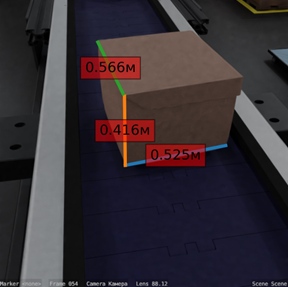